In [13]:
%%writefile mlt_convergence.cpp
#include <iostream>
#include <fstream>
#include <vector>
#include <cmath>
#include <random>
#include <iomanip>
#include <sstream>

// --- 1. CORE MATH & GEOMETRY ---
struct Vec3 {
    double x, y, z;
    Vec3() : x(0), y(0), z(0) {}
    Vec3(double x, double y, double z) : x(x), y(y), z(z) {}
    Vec3 operator+(const Vec3& v) const { return Vec3(x+v.x, y+v.y, z+v.z); }
    Vec3 operator-(const Vec3& v) const { return Vec3(x-v.x, y-v.y, z-v.z); }
    Vec3 operator*(double d) const { return Vec3(x*d, y*d, z*d); }
    Vec3 cross(const Vec3& v) const { return Vec3(y*v.z - z*v.y, z*v.x - x*v.z, x*v.y - y*v.x); }
    double dot(const Vec3& v) const { return x*v.x + y*v.y + z*v.z; }
    double length() const { return std::sqrt(dot(*this)); }
    Vec3 normalize() const { double l = length(); return Vec3(x/l, y/l, z/l); }
};

const double M = 1.0;
const double EventHorizon = 2.0 * M;

Vec3 gravity_acceleration(const Vec3& pos, const Vec3& vel) {
    double r = pos.length();
    if (r < EventHorizon) return Vec3(0,0,0);
    Vec3 h = pos.cross(vel);
    double h2 = h.dot(h);
    double r5 = std::pow(r, 5);
    return pos * (-3.0 * M * h2 / r5);
}

void rk4_step(Vec3& pos, Vec3& vel, double dt) {
    Vec3 k1_v = gravity_acceleration(pos, vel);
    Vec3 k1_p = vel;
    Vec3 k2_v = gravity_acceleration(pos + k1_p * (dt/2.0), vel + k1_v * (dt/2.0));
    Vec3 k2_p = vel + k1_v * (dt/2.0);
    Vec3 k3_v = gravity_acceleration(pos + k2_p * (dt/2.0), vel + k2_v * (dt/2.0));
    Vec3 k3_p = vel + k2_v * (dt/2.0);
    Vec3 k4_v = gravity_acceleration(pos + k3_p * dt, vel + k3_v * dt);
    Vec3 k4_p = vel + k3_v * dt;

    pos = pos + (k1_p + k2_p * 2.0 + k3_p * 2.0 + k4_p) * (dt / 6.0);
    vel = vel + (k1_v + k2_v * 2.0 + k3_v * 2.0 + k4_v) * (dt / 6.0);
}

// --- 3. THE ENVIRONMENT (Static Cinematic Camera) ---
double trace_photon(double u, double v, int width, int height) {
    Vec3 cam_pos(0.0, 3.0, 25.0);
    double screen_x = (2.0 * u - 1.0) * ((double)width/height);
    double screen_y = (2.0 * v - 1.0);

    Vec3 forward = Vec3(0.0, -3.0, -25.0).normalize();
    Vec3 right = Vec3(1.0, 0.0, 0.0);
    Vec3 up = right.cross(forward).normalize();

    double fov_scale = 0.35;
    Vec3 ray_dir = (forward + right * (screen_x * fov_scale) + up * (screen_y * fov_scale)).normalize();

    Vec3 pos = cam_pos;
    Vec3 vel = ray_dir;
    double dt = 0.05;

    for (int step = 0; step < 1500; ++step) {
        Vec3 old_pos = pos;
        rk4_step(pos, vel, dt);
        double r = pos.length();
        if (r <= EventHorizon) return 0.0;

        if ((old_pos.y > 0.0 && pos.y <= 0.0) || (old_pos.y < 0.0 && pos.y >= 0.0)) {
            if (r > 2.6 * M && r < 14.0 * M) return 15.0 / (r * r);
        }
        if (r > 35.0) break;
    }
    return 0.0;
}

// --- 4. METROPOLIS LIGHT TRANSPORT (Progressive Save) ---
int main() {
    const int width = 600; // Good resolution for monitoring convergence
    const int height = 600;
    const int total_iterations = 20000000; // 2 Million total shots
    const int num_frames = 60; // We will extract 40 frames over the process
    const int iterations_per_frame = total_iterations / num_frames;

    std::vector<double> image(width * height, 0.0);

    std::mt19937 rng(1337);
    std::uniform_real_distribution<double> uni(0.0, 1.0);
    std::normal_distribution<double> norm(0.0, 0.003);

    double u_current, v_current, I_current;

    std::cerr << "Searching for initial light path..." << std::endl;
    do {
        u_current = uni(rng);
        v_current = uni(rng);
        I_current = trace_photon(u_current, v_current, width, height);
    } while (I_current == 0.0);

    std::cerr << "Target acquired. Recording MLT Convergence..." << std::endl;

    int frame_count = 0;

    for (int i = 0; i < total_iterations; ++i) {
        // Core MLT Mutation
        double u_proposal, v_proposal;
        if (uni(rng) < 0.05) {
            u_proposal = uni(rng);
            v_proposal = uni(rng);
        } else {
            u_proposal = std::fmod(u_current + norm(rng) + 1.0, 1.0);
            v_proposal = std::fmod(v_current + norm(rng) + 1.0, 1.0);
        }

        double I_proposal = trace_photon(u_proposal, v_proposal, width, height);
        double acceptance_ratio = (I_current == 0.0) ? 1.0 : std::min(1.0, I_proposal / I_current);

        if (uni(rng) < acceptance_ratio) {
            u_current = u_proposal;
            v_current = v_proposal;
            I_current = I_proposal;
        }

        int px = std::min(width - 1, std::max(0, (int)(u_current * width)));
        int py = std::min(height - 1, std::max(0, (int)(v_current * height)));
        image[py * width + px] += I_current;

        // --- PROGRESSIVE SAVE LOGIC ---
        // Every 50,000 iterations, we freeze the buffer and save it to a frame.
        if ((i + 1) % iterations_per_frame == 0) {
            std::stringstream ss;
            ss << "algo_frame_" << std::setw(3) << std::setfill('0') << frame_count++ << ".ppm";
            std::ofstream file(ss.str());
            file << "P3\n" << width << " " << height << "\n255\n";

            double max_val = 0.0;
            for (double v : image) if (v > max_val) max_val = v;
            if (max_val == 0.0) max_val = 1.0;

            for (int y = height - 1; y >= 0; --y) {
                for (int x = 0; x < width; ++x) {
                    double val = image[y * width + x] / (max_val * 0.08);
                    val = std::min(1.0, std::max(0.0, val));
                    val = std::pow(val, 1.0/2.2);
                    int r = std::min(255, (int)(val * 255.0));
                    int g = std::min(255, (int)(val * 180.0));
                    int b = std::min(255, (int)(val * 80.0));
                    file << r << " " << g << " " << b << "\n";
                }
            }
            file.close();
            std::cerr << "Saved Convergence Frame " << frame_count << " of " << num_frames << "\r" << std::flush;
        }
    }
    std::cerr << "\nAlgorithm Convergence Simulation Complete." << std::endl;
    return 0;
}

Writing mlt_convergence.cpp


In [14]:
!g++ -O3 -ffast-math -std=c++17 mlt_convergence.cpp -o render_algo

In [15]:
!time ./render_algo

Searching for initial light path...
Target acquired. Recording MLT Convergence...
Saved Convergence Frame 60 of 60
Algorithm Convergence Simulation Complete.

real	17m30.002s
user	17m18.091s
sys	0m0.821s


Assembling the convergence frames...
Convergence video generated successfully.


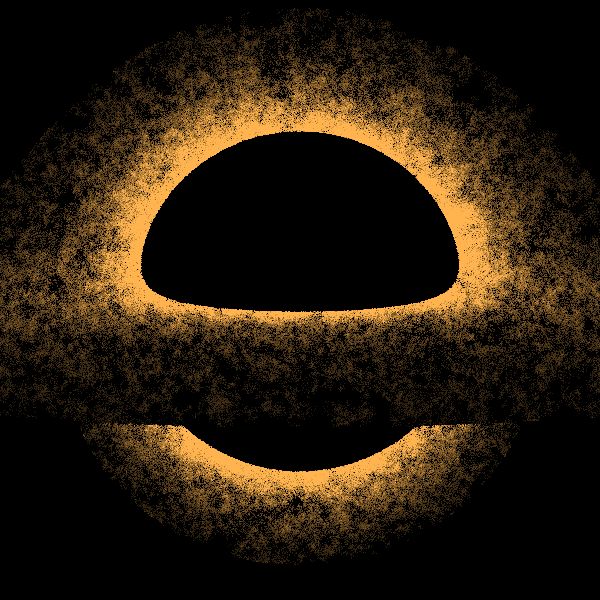

In [16]:
import imageio.v2 as imageio
import numpy as np
import glob
from IPython.display import display, Image

def read_ppm(filename):
    with open(filename, 'r') as f:
        f.readline() # P3
        width, height = map(int, f.readline().split())
        f.readline() # 255
        data = np.fromiter(f.read().split(), dtype=np.uint8)
        return data.reshape((height, width, 3))

print("Assembling the convergence frames...")

# Gather the specific algorithm frames we just generated
frame_files = sorted(glob.glob("algo_frame_*.ppm"))
frames = []

for file in frame_files:
    frames.append(read_ppm(file))

# Save as an animated GIF at a slightly slower framerate to see the convergence
gif_path = "mlt_convergence.gif"
imageio.mimsave(gif_path, frames, fps=8)

print("Convergence video generated successfully.")

# Display it!
display(Image(filename=gif_path))

In [1]:
%%writefile mlt_masterpiece.cpp
#include <iostream>
#include <fstream>
#include <vector>
#include <cmath>
#include <random>
#include <iomanip>
#include <sstream>

const double PI = 3.14159265358979323846;

// --- 1. CORE MATH & GEOMETRY ---
struct Vec3 {
    double x, y, z;
    Vec3() : x(0), y(0), z(0) {}
    Vec3(double x, double y, double z) : x(x), y(y), z(z) {}
    Vec3 operator+(const Vec3& v) const { return Vec3(x+v.x, y+v.y, z+v.z); }
    Vec3 operator-(const Vec3& v) const { return Vec3(x-v.x, y-v.y, z-v.z); }
    Vec3 operator*(double d) const { return Vec3(x*d, y*d, z*d); }
    Vec3 cross(const Vec3& v) const { return Vec3(y*v.z - z*v.y, z*v.x - x*v.z, x*v.y - y*v.x); }
    double dot(const Vec3& v) const { return x*v.x + y*v.y + z*v.z; }
    double length() const { return std::sqrt(dot(*this)); }
    Vec3 normalize() const { double l = length(); return Vec3(x/l, y/l, z/l); }
};

const double M = 1.0;
const double EventHorizon = 2.0 * M;

Vec3 gravity_acceleration(const Vec3& pos, const Vec3& vel) {
    double r = pos.length();
    if (r < EventHorizon) return Vec3(0,0,0);
    Vec3 h = pos.cross(vel);
    double h2 = h.dot(h);
    double r5 = std::pow(r, 5);
    return pos * (-3.0 * M * h2 / r5);
}

void rk4_step(Vec3& pos, Vec3& vel, double dt) {
    Vec3 k1_v = gravity_acceleration(pos, vel);
    Vec3 k1_p = vel;
    Vec3 k2_v = gravity_acceleration(pos + k1_p * (dt/2.0), vel + k1_v * (dt/2.0));
    Vec3 k2_p = vel + k1_v * (dt/2.0);
    Vec3 k3_v = gravity_acceleration(pos + k2_p * (dt/2.0), vel + k2_v * (dt/2.0));
    Vec3 k3_p = vel + k2_v * (dt/2.0);
    Vec3 k4_v = gravity_acceleration(pos + k3_p * dt, vel + k3_v * dt);
    Vec3 k4_p = vel + k3_v * dt;

    pos = pos + (k1_p + k2_p * 2.0 + k3_p * 2.0 + k4_p) * (dt / 6.0);
    vel = vel + (k1_v + k2_v * 2.0 + k3_v * 2.0 + k4_v) * (dt / 6.0);
}

// --- 2. DYNAMIC ENVIRONMENT ---
double trace_photon(double u, double v, int width, int height, Vec3 cam_pos, Vec3 forward) {
    double screen_x = (2.0 * u - 1.0) * ((double)width/height);
    double screen_y = (2.0 * v - 1.0);

    Vec3 right = Vec3(0.0, 1.0, 0.0).cross(forward).normalize();
    Vec3 up = right.cross(forward).normalize();

    double fov_scale = 0.35;
    Vec3 ray_dir = (forward + right * (screen_x * fov_scale) + up * (screen_y * fov_scale)).normalize();

    Vec3 pos = cam_pos;
    Vec3 vel = ray_dir;
    double dt = 0.05;

    // Simulating rays up to distance 35.0 so we capture the light bending from the back!
    for (int step = 0; step < 1500; ++step) {
        Vec3 old_pos = pos;
        rk4_step(pos, vel, dt);
        double r = pos.length();
        if (r <= EventHorizon) return 0.0;

        // Solid disk on the equatorial plane
        if ((old_pos.y > 0.0 && pos.y <= 0.0) || (old_pos.y < 0.0 && pos.y >= 0.0)) {
            if (r > 2.6 * M && r < 14.0 * M) return 15.0 / (r * r);
        }
        if (r > 35.0) break;
    }
    return 0.0;
}

// Helper function to save a frame
void save_frame(const std::vector<double>& image, int width, int height, int frame_index) {
    std::stringstream ss;
    ss << "frame_" << std::setw(3) << std::setfill('0') << frame_index << ".ppm";
    std::ofstream file(ss.str());
    file << "P3\n" << width << " " << height << "\n255\n";

    double max_val = 0.0;
    for (double v : image) if (v > max_val) max_val = v;
    if (max_val == 0.0) max_val = 1.0;

    for (int y = height - 1; y >= 0; --y) {
        for (int x = 0; x < width; ++x) {
            double val = image[y * width + x] / (max_val * 0.08);
            val = std::min(1.0, std::max(0.0, val));
            val = std::pow(val, 1.0/2.2);
            int r = std::min(255, (int)(val * 255.0));
            int g = std::min(255, (int)(val * 180.0));
            int b = std::min(255, (int)(val * 80.0));
            file << r << " " << g << " " << b << "\n";
        }
    }
    file.close();
}

// --- 3. THE UNIFIED CONTROLLER ---
int main() {
    const int width = 300;
    const int height = 300;
    const int convergence_frames = 50;
    const int orbit_frames = 50;
    const int total_frames = convergence_frames + orbit_frames;

    std::mt19937 rng(1337);
    std::uniform_real_distribution<double> uni(0.0, 1.0);
    std::normal_distribution<double> norm(0.0, 0.005);

    std::cerr << "--- PHASE 1: MARKOV CHAIN CONVERGENCE ---" << std::endl;

    // Starting camera position (Left side, -90 degrees)
    double radius = 22.0;
    Vec3 start_cam(radius * std::sin(-PI/2.0), 3.0, radius * std::cos(PI/2.0));
    Vec3 start_fwd = (Vec3(0,0,0) - start_cam).normalize();

    std::vector<double> conv_image(width * height, 0.0);
    double u_curr, v_curr, I_curr;
    do { u_curr = uni(rng); v_curr = uni(rng); I_curr = trace_photon(u_curr, v_curr, width, height, start_cam, start_fwd); } while (I_curr == 0.0);

    int iters_per_conv_frame = 30000;
    for (int f = 0; f < convergence_frames; ++f) {
        for (int i = 0; i < iters_per_conv_frame; ++i) {
            double u_prop, v_prop;
            if (uni(rng) < 0.05) { u_prop = uni(rng); v_prop = uni(rng); }
            else { u_prop = std::fmod(u_curr + norm(rng) + 1.0, 1.0); v_prop = std::fmod(v_curr + norm(rng) + 1.0, 1.0); }

            double I_prop = trace_photon(u_prop, v_prop, width, height, start_cam, start_fwd);
            if (uni(rng) < ((I_curr == 0.0) ? 1.0 : std::min(1.0, I_prop / I_curr))) {
                u_curr = u_prop; v_curr = v_prop; I_curr = I_prop;
            }
            int px = std::min(width - 1, std::max(0, (int)(u_curr * width)));
            int py = std::min(height - 1, std::max(0, (int)(v_curr * height)));
            conv_image[py * width + px] += I_curr;
        }
        save_frame(conv_image, width, height, f);
        std::cerr << "Convergence Frame " << f + 1 << " / " << convergence_frames << "\r" << std::flush;
    }

    std::cerr << "\n--- PHASE 2: 3D VOLUMETRIC ORBIT (180 Deg Sweep & Y-Bob) ---" << std::endl;

    for (int f = 0; f < orbit_frames; ++f) {
        std::vector<double> orbit_image(width * height, 0.0);

        // t goes from 0.0 to 1.0 over the orbit
        double t = (double)f / (orbit_frames - 1);

        // 180-degree sweep from -PI/2 (left) to +PI/2 (right)
        double angle = -PI/2.0 + (t * PI);

        // Y-axis bobs up to 6.0 and back down to 3.0 smoothly using sine wave
        double cam_y = 3.0 + 3.0 * std::sin(t * PI);

        Vec3 cam_pos(radius * std::sin(angle), cam_y, radius * std::cos(angle));
        Vec3 forward = (Vec3(0,0,0) - cam_pos).normalize();

        do { u_curr = uni(rng); v_curr = uni(rng); I_curr = trace_photon(u_curr, v_curr, width, height, cam_pos, forward); } while (I_curr == 0.0);

        // 150,000 iterations per orbit frame for a clean 3D picture
        for (int i = 0; i < 150000; ++i) {
            double u_prop, v_prop;
            if (uni(rng) < 0.05) { u_prop = uni(rng); v_prop = uni(rng); }
            else { u_prop = std::fmod(u_curr + norm(rng) + 1.0, 1.0); v_prop = std::fmod(v_curr + norm(rng) + 1.0, 1.0); }

            double I_prop = trace_photon(u_prop, v_prop, width, height, cam_pos, forward);
            if (uni(rng) < ((I_curr == 0.0) ? 1.0 : std::min(1.0, I_prop / I_curr))) {
                u_curr = u_prop; v_curr = v_prop; I_curr = I_prop;
            }
            int px = std::min(width - 1, std::max(0, (int)(u_curr * width)));
            int py = std::min(height - 1, std::max(0, (int)(v_curr * height)));
            orbit_image[py * width + px] += I_curr;
        }

        // Save frames continuously after convergence frames (e.g., frame_020 to frame_049)
        save_frame(orbit_image, width, height, convergence_frames + f);
        std::cerr << "Orbit Frame " << f + 1 << " / " << orbit_frames << "\r" << std::flush;
    }

    std::cerr << "\nMasterpiece Generation Complete. Total Frames: " << total_frames << std::endl;
    return 0;
}

Writing mlt_masterpiece.cpp


In [2]:
!g++ -O3 -ffast-math -std=c++17 mlt_masterpiece.cpp -o render_master

In [3]:
!time ./render_master

--- PHASE 1: MARKOV CHAIN CONVERGENCE ---
Convergence Frame 20 / 20
--- PHASE 2: 3D VOLUMETRIC ORBIT (180 Deg Sweep & Y-Bob) ---
Orbit Frame 30 / 30
Masterpiece Generation Complete. Total Frames: 50

real	3m39.117s
user	3m36.709s
sys	0m0.152s


Assembling the unified cinematic sequence...
Masterpiece compiled successfully.


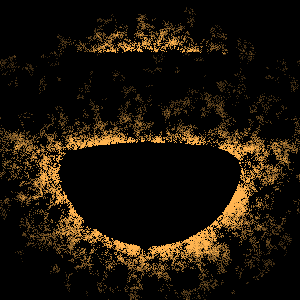

In [19]:
import imageio.v2 as imageio
import numpy as np
import glob
from IPython.display import display, Image

def read_ppm(filename):
    with open(filename, 'r') as f:
        f.readline() # P3
        width, height = map(int, f.readline().split())
        f.readline() # 255
        data = np.fromiter(f.read().split(), dtype=np.uint8)
        return data.reshape((height, width, 3))

print("Assembling the unified cinematic sequence...")

# Gather frames 000 through 049
frame_files = sorted(glob.glob("frame_*.ppm"))
frames = []

for file in frame_files:
    frames.append(read_ppm(file))

# Save as an animated GIF at 10 frames per second
gif_path = "blackhole_masterpiece.gif"
imageio.mimsave(gif_path, frames, fps=10)

print("Masterpiece compiled successfully.")
display(Image(filename=gif_path))

In [8]:
%%writefile mlt_interactive.cpp
#include <iostream>
#include <fstream>
#include <vector>
#include <cmath>
#include <random>
#include <string>
#include <algorithm>

const double PI = 3.14159265358979323846;

// --- 1. CORE MATH & GEOMETRY ---
struct Vec3 {
    double x, y, z;
    Vec3() : x(0), y(0), z(0) {}
    Vec3(double x, double y, double z) : x(x), y(y), z(z) {}
    Vec3 operator+(const Vec3& v) const { return Vec3(x+v.x, y+v.y, z+v.z); }
    Vec3 operator-(const Vec3& v) const { return Vec3(x-v.x, y-v.y, z-v.z); }
    Vec3 operator*(double d) const { return Vec3(x*d, y*d, z*d); }
    Vec3 cross(const Vec3& v) const { return Vec3(y*v.z - z*v.y, z*v.x - x*v.z, x*v.y - y*v.x); }
    double dot(const Vec3& v) const { return x*v.x + y*v.y + z*v.z; }
    double length() const { return std::sqrt(dot(*this)); }
    Vec3 normalize() const { double l = length(); return Vec3(x/l, y/l, z/l); }
};

const double M = 1.0;
const double EventHorizon = 2.0 * M;

Vec3 gravity_acceleration(const Vec3& pos, const Vec3& vel) {
    double r = pos.length();
    if (r < EventHorizon) return Vec3(0,0,0);
    Vec3 h = pos.cross(vel);
    double h2 = h.dot(h);
    double r5 = std::pow(r, 5);
    return pos * (-3.0 * M * h2 / r5);
}

void rk4_step(Vec3& pos, Vec3& vel, double dt) {
    Vec3 k1_v = gravity_acceleration(pos, vel);
    Vec3 k1_p = vel;
    Vec3 k2_v = gravity_acceleration(pos + k1_p * (dt/2.0), vel + k1_v * (dt/2.0));
    Vec3 k2_p = vel + k1_v * (dt/2.0);
    Vec3 k3_v = gravity_acceleration(pos + k2_p * (dt/2.0), vel + k2_v * (dt/2.0));
    Vec3 k3_p = vel + k2_v * (dt/2.0);
    Vec3 k4_v = gravity_acceleration(pos + k3_p * dt, vel + k3_v * dt);
    Vec3 k4_p = vel + k3_v * dt;

    pos = pos + (k1_p + k2_p * 2.0 + k3_p * 2.0 + k4_p) * (dt / 6.0);
    vel = vel + (k1_v + k2_v * 2.0 + k3_v * 2.0 + k4_v) * (dt / 6.0);
}

// --- 2. THE DYNAMIC ENVIRONMENT ---
double trace_photon(double u, double v, int width, int height, Vec3 cam_pos, Vec3 forward) {
    double screen_x = (2.0 * u - 1.0) * ((double)width/height);
    double screen_y = (2.0 * v - 1.0);
    Vec3 right = Vec3(0.0, 1.0, 0.0).cross(forward).normalize();
    Vec3 up = right.cross(forward).normalize();

    double fov_scale = 0.35;
    Vec3 ray_dir = (forward + right * (screen_x * fov_scale) + up * (screen_y * fov_scale)).normalize();

    Vec3 pos = cam_pos;
    Vec3 vel = ray_dir;
    double dt = 0.05;

    for (int step = 0; step < 1200; ++step) {
        Vec3 old_pos = pos;
        rk4_step(pos, vel, dt);
        double r = pos.length();
        if (r <= EventHorizon) return 0.0;

        if ((old_pos.y > 0.0 && pos.y <= 0.0) || (old_pos.y < 0.0 && pos.y >= 0.0)) {
            if (r > 2.6 * M && r < 14.0 * M) return 15.0 / (r * r);
        }
        if (r > 35.0) break;
    }
    return 0.0;
}

// --- 3. PARAMETERIZED CONTROLLER ---
int main(int argc, char** argv) {
    // Default camera angles
    double angle_deg = 0.0;
    double cam_y = 3.0;

    // Parse arguments injected by Python
    if (argc > 1) angle_deg = std::stod(argv[1]);
    if (argc > 2) cam_y = std::stod(argv[2]);

    double angle_rad = angle_deg * PI / 180.0;
    double radius = 22.0;

    // Fast preview resolution and iterations
    const int width = 200;
    const int height = 200;
    const int iterations = 100000; // Low enough for quick updates, high enough to see the shape

    std::mt19937 rng(42); // Fixed seed so noise pattern remains somewhat stable while moving
    std::uniform_real_distribution<double> uni(0.0, 1.0);
    std::normal_distribution<double> norm(0.0, 0.005);

    std::vector<double> image(width * height, 0.0);

    Vec3 cam_pos(radius * std::sin(angle_rad), cam_y, radius * std::cos(angle_rad));
    Vec3 forward = (Vec3(0,0,0) - cam_pos).normalize();

    double u_curr, v_curr, I_curr;
    do {
        u_curr = uni(rng); v_curr = uni(rng);
        I_curr = trace_photon(u_curr, v_curr, width, height, cam_pos, forward);
    } while (I_curr == 0.0);

    for (int i = 0; i < iterations; ++i) {
        double u_prop, v_prop;
        if (uni(rng) < 0.05) { u_prop = uni(rng); v_prop = uni(rng); }
        else { u_prop = std::fmod(u_curr + norm(rng) + 1.0, 1.0); v_prop = std::fmod(v_curr + norm(rng) + 1.0, 1.0); }

        double I_prop = trace_photon(u_prop, v_prop, width, height, cam_pos, forward);
        if (uni(rng) < ((I_curr == 0.0) ? 1.0 : std::min(1.0, I_prop / I_curr))) {
            u_curr = u_prop; v_curr = v_prop; I_curr = I_prop;
        }
        int px = std::min(width - 1, std::max(0, (int)(u_curr * width)));
        int py = std::min(height - 1, std::max(0, (int)(v_curr * height)));
        image[py * width + px] += I_curr;
    }

    std::ofstream file("interactive_frame.ppm");
    file << "P3\n" << width << " " << height << "\n255\n";

    double max_val = 0.0;
    for (double v : image) if (v > max_val) max_val = v;
    if (max_val == 0.0) max_val = 1.0;

    for (int y = height - 1; y >= 0; --y) {
        for (int x = 0; x < width; ++x) {
            double val = image[y * width + x] / (max_val * 0.1);
            val = std::min(1.0, std::max(0.0, val));
            val = std::pow(val, 1.0/2.2);
            int r = std::min(255, (int)(val * 255.0));
            int g = std::min(255, (int)(val * 180.0));
            int b = std::min(255, (int)(val * 80.0));
            file << r << " " << g << " " << b << "\n";
        }
    }
    file.close();
    return 0;
}

Writing mlt_interactive.cpp


In [9]:
!g++ -O3 -ffast-math -std=c++17 mlt_interactive.cpp -o interactive_engine

In [20]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
import numpy as np
import subprocess
import os

def read_ppm(filename):
    with open(filename, 'r') as f:
        f.readline() # P3
        width, height = map(int, f.readline().split())
        f.readline() # 255
        data = np.fromiter(f.read().split(), dtype=np.uint8)
        return data.reshape((height, width, 3))

# Create the output visual area
out = widgets.Output()

def update_view(angle_deg, camera_y):
    with out:
        clear_output(wait=True)
        # Call your C++ engine with the slider parameters
        subprocess.run(["./interactive_engine", str(angle_deg), str(camera_y)])

        # Load and display the generated frame
        if os.path.exists("interactive_frame.ppm"):
            img = read_ppm("interactive_frame.ppm")
            plt.figure(figsize=(6, 6))
            plt.imshow(img)
            plt.title(f"Camera Angle: {angle_deg}°, Height: {camera_y} units", color='white')
            plt.axis('off')
            fig = plt.gcf()
            fig.patch.set_facecolor('black')
            plt.show()
        else:
            print("Engine failed to render frame.")

# Create Sliders
angle_slider = widgets.FloatSlider(
    value=0.0,
    min=-90.0,
    max=90.0,
    step=5.0,
    description='Orbit Angle (°):',
    continuous_update=False # Updates only when you release the mouse (to prevent crashing)
)

height_slider = widgets.FloatSlider(
    value=3.0,
    min=0.0,
    max=10.0,
    step=0.5,
    description='Height (Y):',
    continuous_update=False
)

# Link the sliders to the update function
interactive_plot = widgets.interactive(update_view, angle_deg=angle_slider, camera_y=height_slider)

# Display the control panel and the image output
display(widgets.VBox([angle_slider, height_slider, out]))

# Trigger the first render
update_view(0.0, 3.0)